In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
PYTHON_PATHS = ["../.."]
import sys
for path in PYTHON_PATHS:
    if path not in sys.path:
        sys.path.append(path)

from pytorch_lightning.utilities.parsing import AttributeDict
import os
from pathlib import Path
import torch
from tqdm.notebook import tqdm

import cv2
import matplotlib.pyplot as plt
import numpy as np
import plotly.graph_objects as go
import plotly.express as px
from imap.utils.torch_math import *
from imap.utils.utils import *

from imap.data.datasets.tum.tum_dataset_loader_factory import TUMDatasetLoaderFactory
from imap.model.nerf import NERF
from imap.model.embeddings.gaussian_positional_encoding import GaussianPositionalEncoding
from imap.utils import UniversalFactory
from imap.utils.torch_math import back_project_pixel, repeat_tensor
from imap.model.active_sampling.image_active_sampling import ImageActiveSampling
from imap.trainers.trainers import ModelTrainer

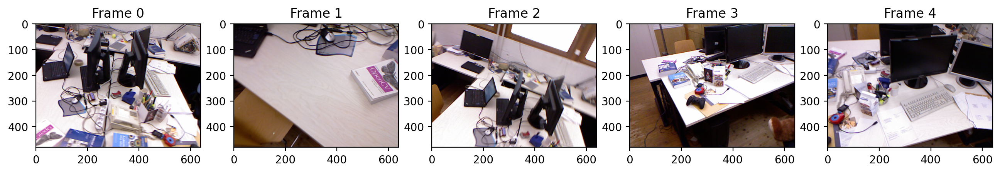

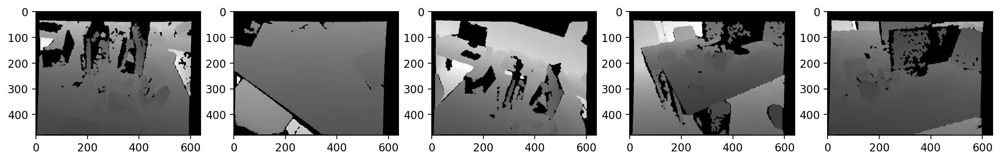

In [3]:

test_images_list = [
"1305031458.159638.png", "1305031462.692548.png", "1305031464.959763.png","1305031467.695886.png",  "1305031469.296754.png"
]
test_depthes_list = [
    "1305031458.144808.png", "1305031462.680788.png", "1305031464.952471.png", "1305031467.686044.png", "1305031469.288263.png"
]

figure = plt.figure(dpi=200, figsize=(16,10))

for i in range(len(test_images_list)):
    
    color_image_path = str(Path(f"../../tests/datasets/tum rgbd/rgbd_dataset_freiburg1_desk/rgb/{test_images_list[i]}"))
    color_image = cv2.imread(color_image_path)
    plt.subplot(1,5,i+1)
    plt.title(f'Frame {i}')
    plt.imshow(cv2.cvtColor(color_image, cv2.COLOR_RGB2BGR))


    
figure = plt.figure(dpi=200, figsize=(16,10))
factor = 5000 # for the 16-bit PNG files
# OR: factor = 1 # for the 32-bit float images in the ROS bag files
for i in range(len(test_images_list)):
    
    depth_image_path = str(Path(f"../../tests/datasets/tum rgbd/rgbd_dataset_freiburg1_desk/depth/{test_depthes_list[i]}"))
    depth_image = cv2.imread(depth_image_path, -1).astype(np.float32) / factor
    depth_image = np.clip(depth_image, 0, 4)
    plt.subplot(1,5,1+i)
    plt.imshow(depth_image, cmap="gray")

In [4]:
dataset_params = {
    'dataset_path': "../../tests/datasets/tum rgbd/",
    'scene_name': "rgbd_dataset_freiburg1_desk", 
    'association_file_name': "data_association_file.txt", 
    'frame_indices': [131, 257, 325, 407, 455], # association file raw - 1
    'distance_koef': 0.1,
    'clip_distance_threshold': 4.
                 }
camera, dataset_loader = TUMDatasetLoaderFactory.make_dataset_loader(**dataset_params)

Reading ../../tests/datasets/tum rgbd/rgbd_dataset_freiburg1_desk/data_association_file.txt


In [53]:
model_parameters = AttributeDict(
    name="NERF",
    course_sample_bins=32,
    fine_sample_bins=12,
    depth_loss_koef=1.,
    color_loss_koef=5.,
    minimal_depth=0.01,
    positional_embedding = AttributeDict(
                                        name = 'GaussianPositionalEncoding',
                                        encoding_dimension=92,
                                        sigma=25,
                                        use_only_sin=False
                                        )
)

factory = UniversalFactory([NERF, GaussianPositionalEncoding])
model = factory.make_from_parameters(model_parameters, camera_info=camera)

In [54]:
# model.cuda()
model.train()
model.cpu()
image_active_sampler = ImageActiveSampling(camera, points_per_frame=200)
trainer = ModelTrainer(image_active_sampler)

# train_model(model, dataset_loader, camera, trainer, 100, is_image_active_sampling=True)

In [7]:
torch.cuda.empty_cache()

In [56]:
for state in dataset_loader:
    data_batch = trainer.sample_batch(state,  state.frame.get_pixel_probs())
    trainer.send_batch_to_model_device(data_batch, 'cpu')
    pixels = data_batch['pixel']
    sampled_depths = model.stratified_sample_depths(pixels.shape[0], pixels.device, model.course_sample_bins, deterministic=False)
    break
print(pixels.shape)
print(sampled_depths.shape)
batch_size = pixels.shape[0]

depths = torch.sort(sampled_depths, dim=0).values


torch.Size([200, 2])
torch.Size([32, 200])


In [23]:
# torch.cat([sampled_depths, data_batch['depth'][None, :]], dim=0)

In [57]:
back_projected_points = back_project_pixel(pixels, depths, data_batch['camera_position'],
                                                   model._inverted_camera_matrix)

# Depths preprocessing

In [44]:
i = 4
state = dataset_loader[i]
depth = dataset_loader._depth_image[i]
print(np.max(depth))
print(np.max(state.frame.depth_image))

3.5286
0.4


In [133]:
dataset_params = {
    'dataset_path': "/home/quetalasj/datasets/TUM RGBD/", 
    'scene_name': "rgbd_dataset_freiburg1_desk", 
    'association_file_name': "data_association_file.txt", 
    'frame_indices': [*range(573)], # association file raw - 1
    'distance_koef': 0.1,
    'clip_distance_threshold': 4.
                 }
camera, global_dataset = TUMDatasetLoaderFactory.make_dataset_loader(**dataset_params)

Reading /home/quetalasj/datasets/TUM RGBD/rgbd_dataset_freiburg1_desk/data_association_file.txt


In [91]:
d = []
i = 0
for ind, depth in enumerate(global_dataset._depth_image):
    if np.max(depth) > 8:
        i = ind
    d.append(np.max(depth))

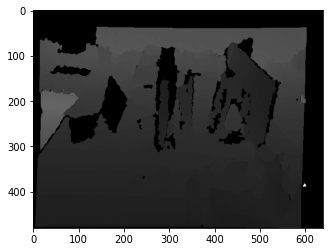

In [93]:
plt.imshow(global_dataset._depth_image[i], cmap="gray")

In [134]:
depth_image = global_dataset._depth_image[i]

In [151]:
proc = depth_image.copy()
proc[np.logical_or(depth_image > 4,
                           depth_image <= 0)] = np.nan

In [162]:
~np.isnan(proc)

array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]])

In [116]:
np.max(proc[proc != np.nan])

nan

In [105]:
depth_image

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]], dtype=float32)

In [89]:
max(d)

8.001

In [57]:
y, x = np.meshgrid(range(480), range(640))
y = y.reshape(-1)
x = x.reshape(-1)
homogeneous_pixel = np.array([x, y, np.ones(y.shape[0])])

In [58]:
homogeneous_keypoints = model._inverted_camera_matrix @ homogeneous_pixel

In [59]:
homogeneous_pixel.T

array([[  0.,   0.,   1.],
       [  0.,   1.,   1.],
       [  0.,   2.,   1.],
       ...,
       [639., 477.,   1.],
       [639., 478.,   1.],
       [639., 479.,   1.]])

In [77]:
homogeneous_keypoints.T

tensor([[-0.6086, -0.4562,  1.0000],
        [-0.6086, -0.4543,  1.0000],
        [-0.6086, -0.4524,  1.0000],
        ...,
        [ 0.6086,  0.4524,  1.0000],
        [ 0.6086,  0.4543,  1.0000],
        [ 0.6086,  0.4562,  1.0000]], dtype=torch.float64)

In [75]:
np.linalg.norm(homogeneous_keypoints.T, axis=1)

array([1.25637132, 1.25568096, 1.2549931 , ..., 1.25499311, 1.25568097,
       1.25637134])

# Backprojection

In [ ]:
scale = 1
x, y = generate_image_meshgrid(color_image1.shape[0], color_image1.shape[1], scale)

In [115]:
get_pixels_from_meshgrid(x, y, scale)

array([[  0,   0],
       [  1,   0],
       [  2,   0],
       ...,
       [637, 479],
       [638, 479],
       [639, 479]], dtype=int32)

In [119]:
inverted_camera_matrix = torch.tensor(data_module._dataset._camera_info.get_inverted_camera_matrix().astype(np.float32))
scale = 1

depth_image1 = data_module._dataset._depth_images[frames[0]]
position1 = torch.tensor(data_module._dataset._positions[frames[0]])
# position1 = torch.repeat_interleave(position1[None], depth_image1.shape[0]*depth_image1.shape[1]//(scale**2), dim=0)

depth_image2 = data_module._dataset._depth_images[frames[1]]
position2 = torch.tensor(data_module._dataset._positions[frames[1]])
# position2 = torch.repeat_interleave(position2[None], depth_image2.shape[0]*depth_image2.shape[1]//(scale**2), dim=0)

print(position1.shape)
print(position1)
print(position2)

def get_point_cloud(depth_image, position, inverted_camera_matrix, scale=1):
    x, y = generate_image_meshgrid(depth_image.shape[0], depth_image.shape[1], scale)       
    pixels = get_pixels_from_meshgrid(x, y, scale)
    
    depths = torch.tensor(get_depths_in_pixels(depth_image, pixels)).float()
    pixels = torch.tensor(pixels.astype(np.float32))

    return back_project_pixel(pixels, depths, position, inverted_camera_matrix).cpu().detach().numpy()



torch.Size([4, 4])
tensor([[ 0.9914,  0.1184,  0.0552,  0.0231],
        [ 0.0323, -0.6314,  0.7748, -0.0324],
        [ 0.1266, -0.7664, -0.6298,  0.1691],
        [ 0.0000,  0.0000,  0.0000,  1.0000]])
tensor([[ 0.9397,  0.3413, -0.0200,  0.0041],
        [ 0.1840, -0.4555,  0.8710, -0.0378],
        [ 0.2881, -0.8222, -0.4909,  0.1868],
        [ 0.0000,  0.0000,  0.0000,  1.0000]])


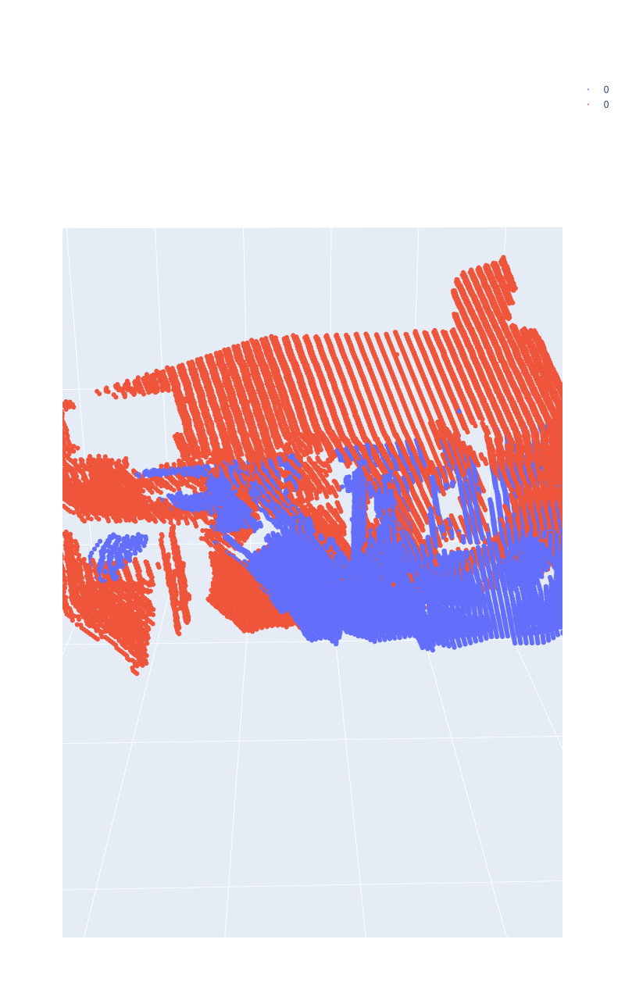

In [117]:


points0 = get_point_cloud(depth_image1, position1, inverted_camera_matrix, scale=scale)
points1 = get_point_cloud(depth_image2, position2, inverted_camera_matrix, scale=scale)


fig = go.Figure(
    data=[
        go.Scatter3d(x=points0[::10, 0],
                     y=points0[::10, 1], 
                     z=points0[::10, 2],
                     mode="markers",
                     name="0",
                     marker={
                         "size": 2
                     }),
                go.Scatter3d(x=points1[::10, 0],
                     y=points1[::10, 1], 
                     z=points1[::10, 2],
                     mode="markers",
                     name="0",
                     marker={
                         "size": 2
                     }),
    ],
)
fig.update_layout(height=1280,width=960)
fig.show()

